In [1]:
# %matplotlib widget

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# plt.ion()
np.random.seed(seed=330)

## Creación y graficación de Base de Datos sintética

In [2]:
nu = 200
C1 = np.random.randn(nu,2)
C2 = np.random.randn(nu-5,2)+[3,3]

X = np.vstack((C1,C2))
y = np.vstack((np.zeros((nu,1)),np.ones((nu-5,1))))
print(X.shape)
print(y.shape)
print(y.squeeze().shape)

(395, 2)
(395, 1)
(395,)


# Regresión lineal para clasificación (Clasificador Geométrico)

## Grafiquemos los datos como graficabamos en regresión (eje $x$ es característica, eje $y$ etiquetas)

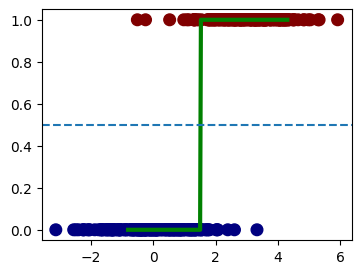

In [3]:
fig = plt.figure(figsize=(4.0, 3))
ax = fig.add_subplot(111)

ax.scatter(X[:,1],y,s=70,cmap='jet',c=y.squeeze())


o = np.ones(X.shape[0])
X1 = np.stack((o,X[:,1]),axis = 1)

inv = np.linalg.inv(np.matmul(X1.T,X1))
w = np.matmul(np.matmul(inv,X1.T,),y)


t = np.linspace(-0.8,4.3,200)
G = np.stack((np.ones(200),t),axis = 1)
# ax.plot(t,np.matmul(G,w),'r')
ax.plot(t,np.matmul(G,w)>0.5,'g', linewidth =3)
ax.axhline(0.5,linestyle='--')
# ax.axvline(1.528366,linestyle='--',color='k',alpha=0.74)
# ax.set_yticks(np.arange(-0.1, 1.1, step=0.1));

## Otra forma de graficar (más util, más usada, mejor)

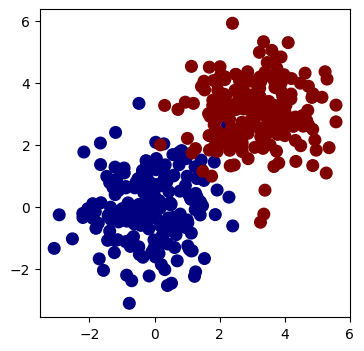

In [4]:
fig = plt.figure(figsize=(4.0, 4))
ax = fig.add_subplot(111)

ax.scatter(X[:,0],X[:,1],s=70,c=y.squeeze(),cmap='jet')

## Regresión Logística

### Sigmoide

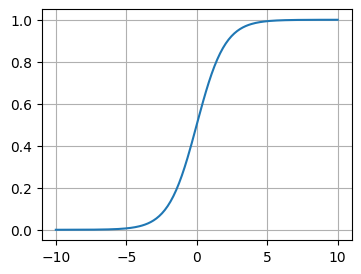

In [5]:
sig = lambda x: 1/(1+np.exp(-x))

t = np.linspace(-10,10,200)
figs = plt.figure(figsize=(4,3))
axs = figs.add_subplot(111)
axs.plot(t,sig(t))
axs.grid(True)

In [6]:
sig(4)

0.9820137900379085

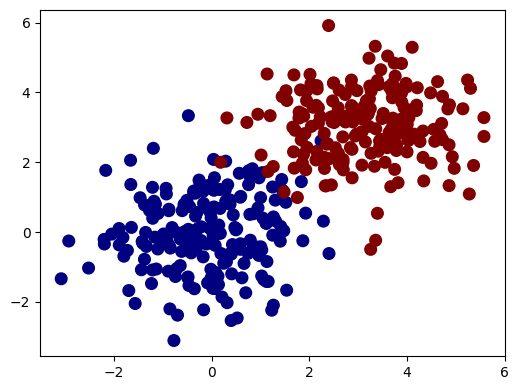

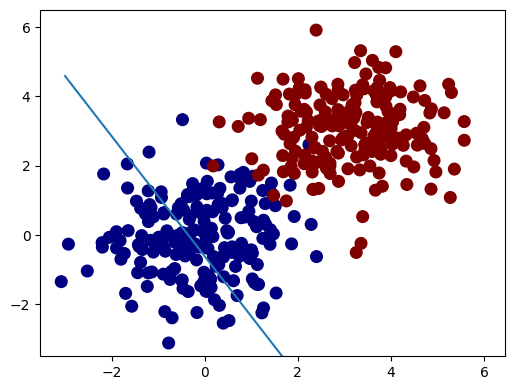

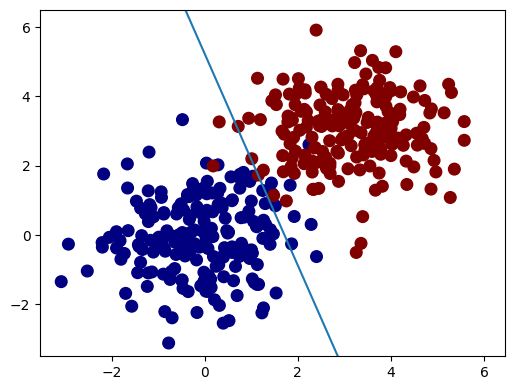

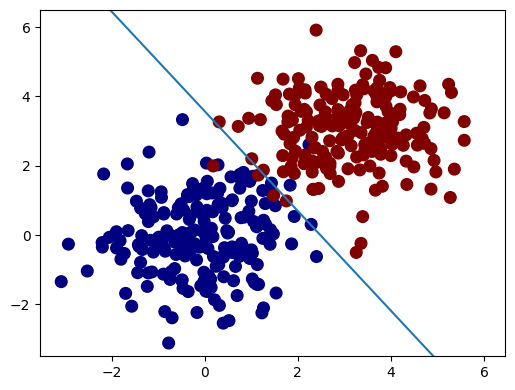

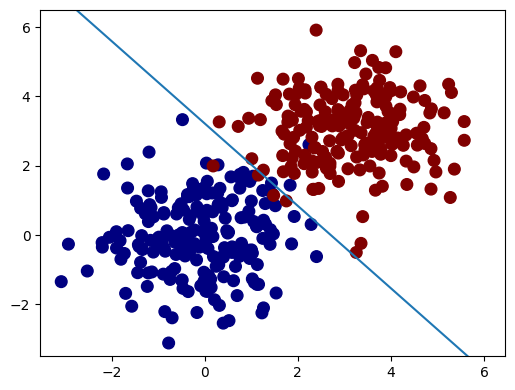

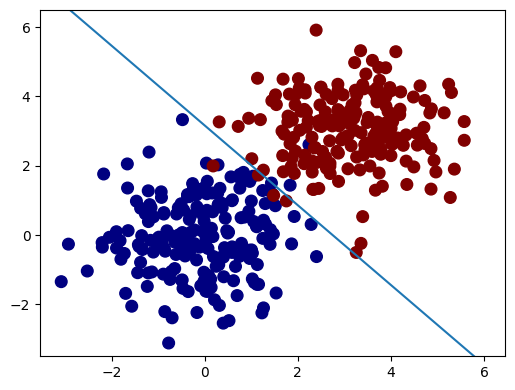

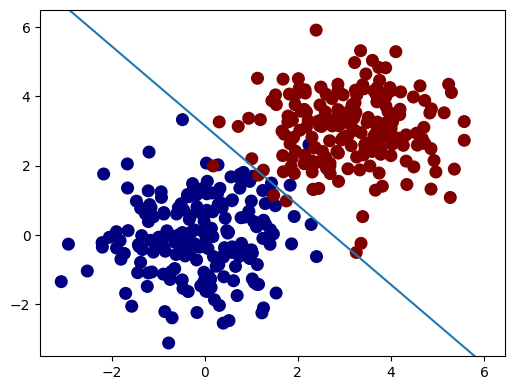

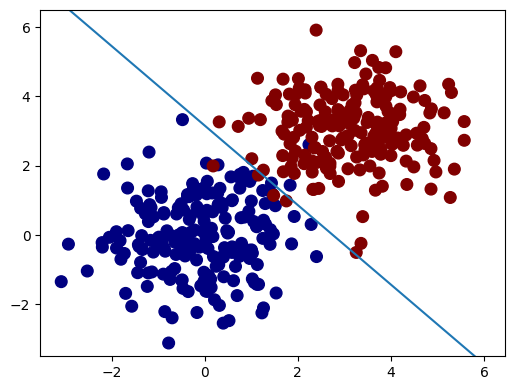

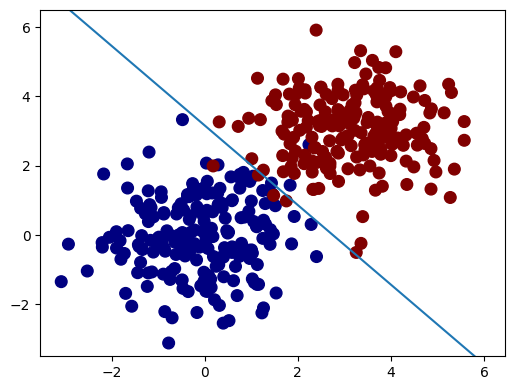

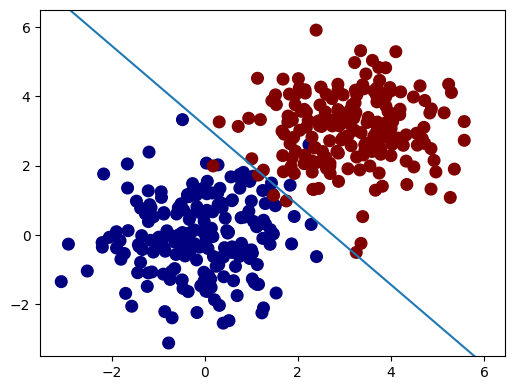

In [7]:
w_rl = 100*np.random.rand(3,1)
t_rl = np.linspace(-3,6,200)

alpha = 0.01
Graficar = True
o = np.ones(200)
X1 = np.stack((o,t_rl,t_rl),axis = 1)


fig2 = plt.figure(figsize=(6,4.5))
ax = fig2.add_subplot(111)
ax.scatter(X[:,0],X[:,1],s=70,c=y.squeeze(),cmap='jet')
fig2.canvas.draw()

sig = lambda x: 1/(1+np.exp(-x))
X_rl = np.hstack((np.ones((X.shape[0],1)), X))

for i in range(402):
    z = X_rl@w_rl
    a = sig(z)
    w_rl = w_rl - alpha*X_rl.T@(a - y)
    
    if (i%50 == 1 and Graficar):
        fig2 = plt.figure(figsize=(6,4.5))
        ax = fig2.add_subplot(111)
        ax.scatter(X[:,0],X[:,1],s=70,c=y.squeeze(),cmap='jet')
        fig2.canvas.draw()
        ax.set_ylim(-3.5,6.5)
        ax.plot(t_rl,(-X1[:,0]*w_rl[0]-X1[:,1]*w_rl[1])/w_rl[2])
        fig2.canvas.draw()
        plt.pause(1)
        
ax.cla()
ax.set_ylim(-3.5,6.5)
ax.scatter(X[:,0],X[:,1],s=70,c=y.squeeze(),cmap='jet')
ax.plot(t_rl,(-X1[:,0]*w_rl[0]-X1[:,1]*w_rl[1])/w_rl[2])
fig2.canvas.draw()

In [8]:
w_rl = 100*np.random.rand(3,1)
t_rl = np.linspace(-3,6,200)

i = 0
fig, ax = plt.subplots()
line1 = ax.scatter(X[:,0],X[:,1],s=70,c=y.squeeze(),cmap='jet')
line2, = ax.plot([],[])
plt.close(fig)
R = []

for i in range(402):
    z = X_rl@w_rl
    a = sig(z)
    w_rl = w_rl - alpha*X_rl.T@(a - y)
    if not i % 20:
        R.append(w_rl)

def anim(i):
    w = R[i]
    line2.set_data(t_rl,(-X1[:,0]*w[0]-X1[:,1]*w[1])/w[2])
    return (line2,)

RL_GD = animation.FuncAnimation(fig, func=anim, frames=len(R), interval=200, blit=True)
HTML(RL_GD.to_jshtml())

/tmp/ipykernel_332910/377106077.py:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax4.scatter(X[:,1],y,s=70,cmap='jet')


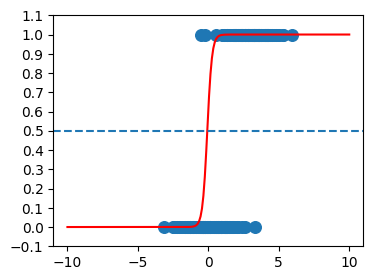

In [9]:
fig4 = plt.figure(figsize=(4, 3))
ax4 = fig4.add_subplot(111)

ax4.scatter(X[:,1],y,s=70,cmap='jet')

ax4.plot(t,sig(X1@w_rl),'r')
ax4.axhline(0.5,linestyle='--')
ax4.set_yticks(np.arange(-0.1, 1.1, step=0.1))
fig4.canvas.draw()

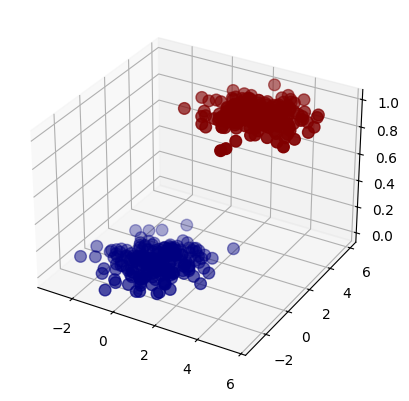

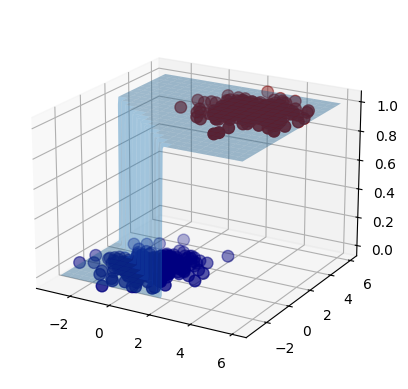

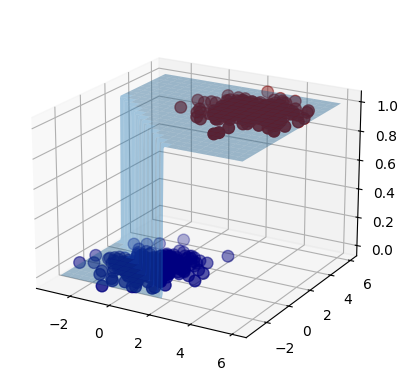

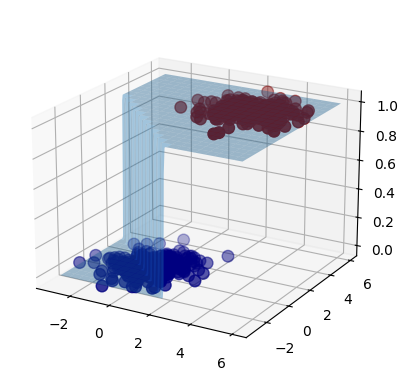

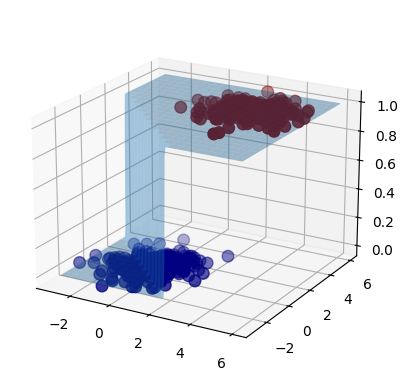

...

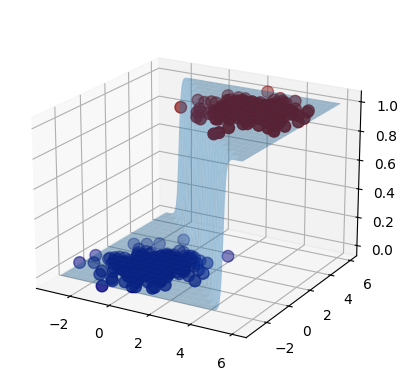

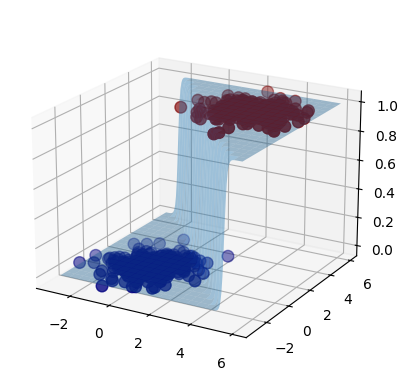

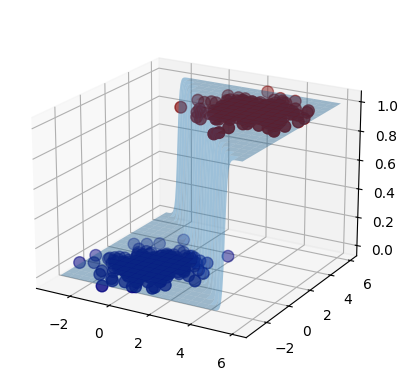

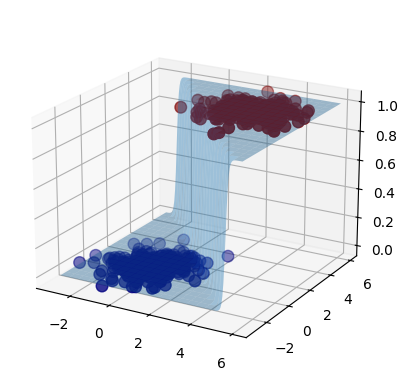

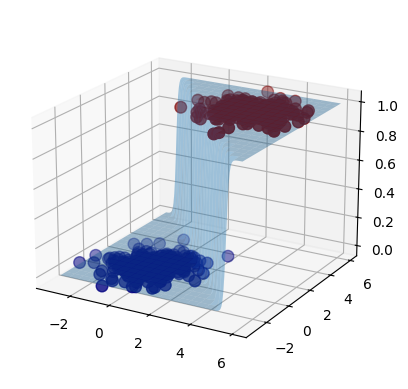

In [10]:
w_rl = 100*np.random.rand(3,1)
t_rl = np.linspace(-3,6,200)

alpha = 0.01
Graficar = True
o = np.ones(200)
X1 = np.stack((o,t_rl,t_rl),axis = 1)


fig2 = plt.figure(figsize=(6.0, 4.8))
ax = fig2.add_subplot(111,projection='3d')
ax.scatter(X[:,0],X[:,1],y,s=70,c=y.squeeze(),cmap='jet')
fig2.canvas.draw()

sig = lambda x: 1/(1+np.exp(-x))
X_rl = np.hstack((np.ones((X.shape[0],1)), X))
R = []

for i in range(402):
    z = X_rl@w_rl
    a = sig(z)
    w_rl = w_rl - alpha*X_rl.T@(a - y)
    X1_, X2_ = np.meshgrid(t_rl,t_rl)
    X1 = X1_.flatten()
    X2 = X2_.flatten()
    XY = np.stack((np.ones(len(X1)),X1,X2),axis = 1)
    
    if (i%10 == 1 and Graficar):
        fig2 = plt.figure(figsize=(6.0, 4.8))
        ax = fig2.add_subplot(111,projection='3d')
        ax.scatter(X[:,0],X[:,1],y,s=70,c=y.squeeze(),cmap='jet')
        fig2.canvas.draw()
        WW = XY@w_rl
        P1 = np.reshape(sig(WW),X1_.shape)
        ax.view_init(elev=20, azim=-60)
        # ax.plot_wireframe(X1_,X2_,P1,rstride=10,cstride=10,alpha=0.5)
        srf = ax.plot_surface(X1_,X2_,P1,rstride=10,cstride=10,alpha=0.4)
        R.append(P1)
        plt.pause(0.3)
        fig2.canvas.draw()
        srf.remove()
        
WW = XY@w_rl
P1 = np.reshape(sig(WW),X1_.shape)
ax.plot_surface(X1_,X2_,P1,rstride=10,cstride=10,alpha=0.4)


In [11]:
def anim(i):
    ax.cla()
    ax.scatter(X[:,0],X[:,1],y,s=70,c=y.squeeze(),cmap='jet')
    w = R[i]
    ax.plot_surface(X1_,X2_,w,rstride=10,cstride=10,alpha=0.4)

RL_GD = animation.FuncAnimation(fig2, func=anim, frames=len(R), interval=200, blit=False)
HTML(RL_GD.to_jshtml())

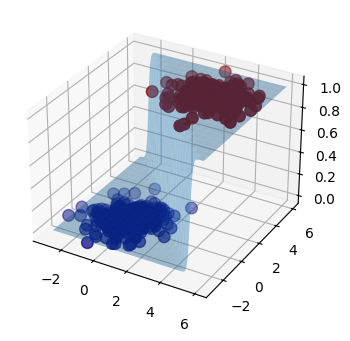

In [12]:
fig = plt.figure(figsize=(6, 4.0))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X[:,0],X[:,1],y,s=70,cmap='jet', c=y.squeeze())

t_rl = np.linspace(-3,6,200)
X1_, X2_ = np.meshgrid(t_rl,t_rl)
X1 = X1_.flatten()
X2 = X2_.flatten()

XY = np.stack((np.ones(len(X1)),X1,X2),axis = 1)
WW = XY@w_rl
P1 = np.reshape(sig(WW),X1_.shape)

# ax.plot_wireframe(X1_,X2_,P1,rstride=10,cstride=10,alpha=0.5)
ax.plot_surface(X1_,X2_,P1,rstride=10,cstride=10,alpha=0.4)


## Con PyTorch

In [13]:
import torch
import torch.nn as nn

In [14]:
class RegresionLogisticaPyTorch(nn.Module):
    def __init__(self):
        super(RegresionLogisticaPyTorch, self).__init__()
        self.linear = nn.Linear(2, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.linear(x)
        x = self.sigmoid(x)
        return x

In [15]:
type(X)

numpy.ndarray

In [16]:
X_tensor = torch.FloatTensor(X)
y_tensor = torch.FloatTensor(y)

In [17]:
type(X_tensor)

torch.Tensor

In [18]:
# modelo PyTorch
model = RegresionLogisticaPyTorch()

# función de pérdida y el optimizador
criterion = nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.5)

# Entrenar
EPOCH = 150
for epoch in range(EPOCH):
    optimizer.zero_grad()
    outputs = model(X_tensor)
    loss = criterion(outputs, y_tensor)
    print(loss.item())
    loss.backward()
    optimizer.step()

0.4132941663265228
0.3478560149669647
0.32353881001472473
0.3056632876396179
0.2907651364803314
0.2777995765209198
0.26629653573036194
0.25598299503326416
0.24667154252529144
0.23822033405303955
0.230515718460083
0.2234637290239334
0.21698559820652008
0.21101422607898712
0.20549234747886658
0.20037080347537994
0.1956070065498352
0.19116418063640594
0.1870102733373642
0.18311728537082672
0.1794607788324356
0.17601917684078217
0.17277343571186066
0.1697067767381668
0.1668042093515396
0.16405251622200012
0.1614396870136261
0.15895509719848633
0.15658919513225555
0.15433330833911896
0.15217962861061096
0.1501210778951645
0.148151233792305
0.14626425504684448
0.14445480704307556
0.14271798729896545
0.1410493552684784
0.13944481313228607
0.13790054619312286
0.13641314208507538
0.13497932255268097
0.13359615206718445
0.13226090371608734
0.1309709995985031
0.12972408533096313
0.12851792573928833
0.12735053896903992
0.1262199431657791
0.12512443959712982
0.12406224757432938
0.12303188443183899


In [19]:
model.linear.weight

Parameter containing:
tensor([[1.4719, 1.2115]], requires_grad=True)

In [20]:
model.linear.bias

Parameter containing:
tensor([-3.6685], requires_grad=True)

In [21]:
np.expand_dims(X[:,0],1).shape

(395, 1)

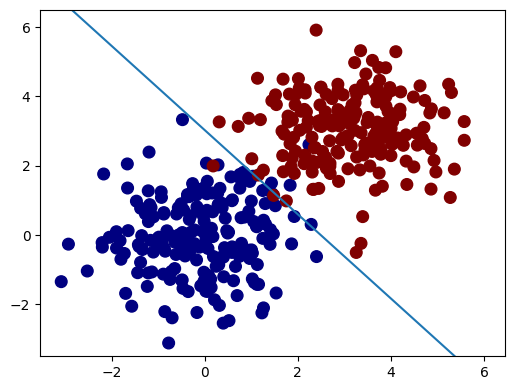

In [22]:
fig2 = plt.figure(figsize=(6,4.5))
ax = fig2.add_subplot(111)
ax.scatter(X[:,0],X[:,1],s=70,c=y.squeeze(),cmap='jet')
fig2.canvas.draw()


pesos = model.linear.weight.detach().numpy()
bias = model.linear.bias.detach().numpy()

ax.set_ylim(-3.5,6.5)
ax.plot(t_rl,(-bias[0]-t_rl*pesos[0,0])/pesos[0,1])
fig2.canvas.draw()